In [1]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

from tensorflow.keras.preprocessing.image import ImageDataGenerator

/home/yifan/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
2025-03-31 15:17:01.776788: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-31 15:17:02.092829: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743459422.199299   15997 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory f

In [2]:
image_path = '../temp/training/Images/'
mask_path = '../temp/training/Masks/'
SIZE = 128

In [3]:
# lists of images and masks names
image_names = next(os.walk(image_path))[-1]
mask_names = next(os.walk(mask_path))[-1]

image_names.sort()
mask_names.sort()

images = np.zeros(shape=(len(image_names), SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names), SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
    path = image_path + image_names[id]
    img = np.asarray(Image.open(path)).astype("float") / 255.0
    img = cv.resize(img, (SIZE, SIZE), cv.INTER_AREA)
    images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
    path = mask_path + mask_names[id]
    mask = np.asarray(Image.open(path)).astype("float") / 255.0
    mask = cv.resize(mask, (SIZE, SIZE), cv.INTER_AREA)
    masks[id] = mask[:, :, :1]

Mask: 100%|██████████| 4320/4320 [00:13<00:00, 310.56it/s] 


In [4]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 4320
Test images: 0


In [5]:
augmentation_factor = 3


# Data Augmentation
def get_augmentation_generators():
    # Define parameters for image data generator
    data_gen_args = dict(
        # rotation_range=15,  # Moderate rotation (lakes can be in any orientation)
        # width_shift_range=0.1,  # Small shifts
        # height_shift_range=0.1,
        # zoom_range=0.1,  # Slight zoom in/out
        horizontal_flip=True,  # Lakes can be flipped
        vertical_flip=True,  # Lakes can be flipped
        # fill_mode="reflect",  # Fill with reflected pixels
        # brightness_range=[0.9, 1.1]     # Subtle brightness changes
    )

    # Create image generator for images
    image_datagen = ImageDataGenerator(**data_gen_args)
    # Create image generator for masks with the same seed
    mask_datagen = ImageDataGenerator(**data_gen_args)

    return image_datagen, mask_datagen


def augment_data(images, masks, augmentation_factor):
    """
    Augment the original dataset by the specified factor.
    Returns augmented images and masks.
    """
    image_datagen, mask_datagen = get_augmentation_generators()

    augmented_images = []
    augmented_masks = []

    print(f"Generating {augmentation_factor}x augmented data...")

    for i in tqdm(range(len(images)), desc="Augmenting"):
        # Get original image and mask
        img = images[i]
        mask = masks[i]

        # Add original image and mask to the augmented datasets
        augmented_images.append(img)
        augmented_masks.append(mask)

        # Generate augmentations
        for j in range(augmentation_factor - 1):
            # Set the same seed for both generators to ensure identical transformations
            seed = np.random.randint(1, 1000)

            # Reshape to match ImageDataGenerator expectations (batch dimension needed)
            img_batch = np.expand_dims(img, 0)
            mask_batch = np.expand_dims(mask, 0)

            # Generate augmented image
            img_gen = image_datagen.flow(img_batch, batch_size=1, seed=seed)
            mask_gen = mask_datagen.flow(mask_batch, batch_size=1, seed=seed)

            # Get the augmented image and mask
            aug_img = next(img_gen)[0]  # [0] to extract from batch
            aug_mask = next(mask_gen)[0]

            augmented_images.append(aug_img)
            augmented_masks.append(aug_mask)

    return np.array(augmented_images), np.array(augmented_masks)


# Apply augmentation to training data
augmented_images_train, augmented_masks_train = augment_data(
    images_train, mask_train, augmentation_factor
)

print(f"Original training data size: {len(images_train)}")
print(f"Augmented training data size: {len(augmented_images_train)}")

Generating 3x augmented data...


Augmenting: 100%|██████████| 4320/4320 [00:01<00:00, 2970.80it/s]


Original training data size: 4320
Augmented training data size: 12960


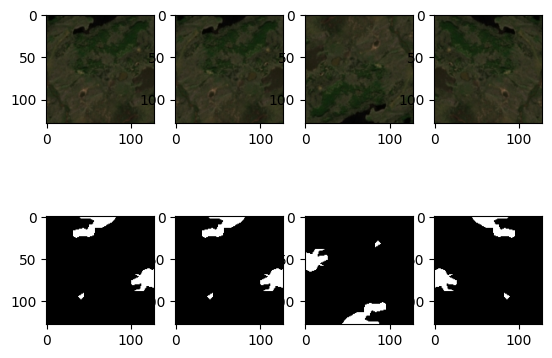

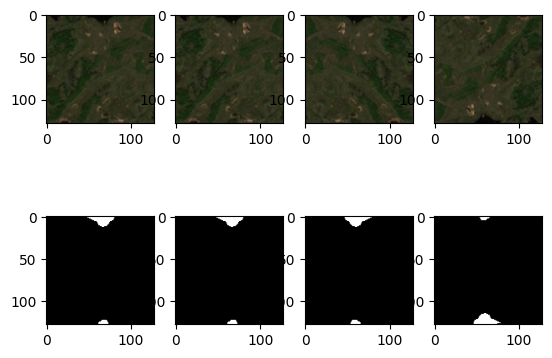

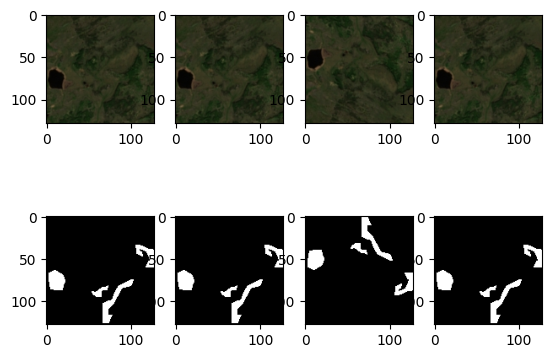

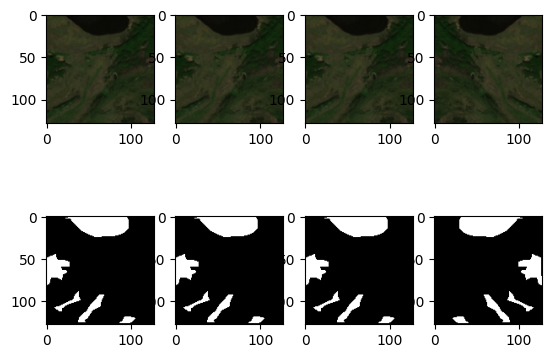

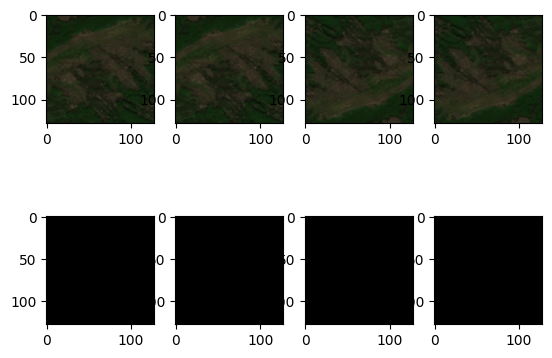

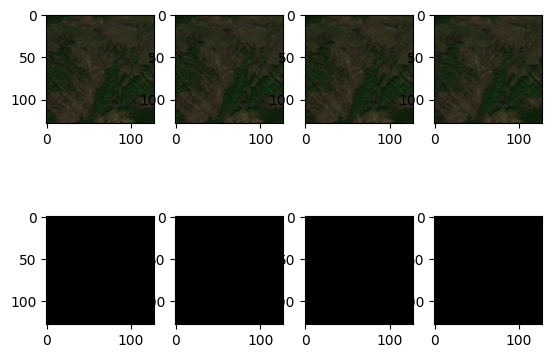

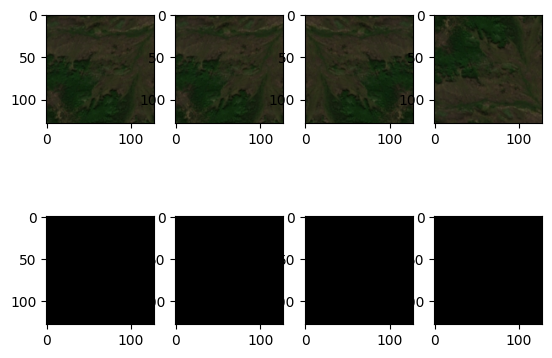

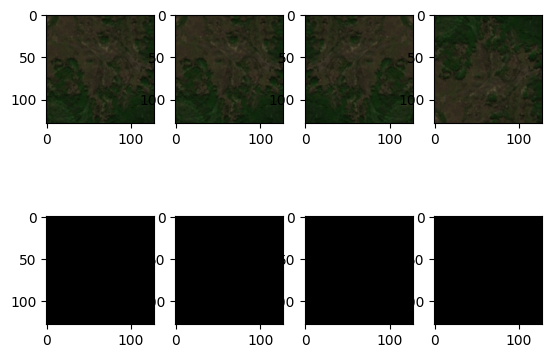

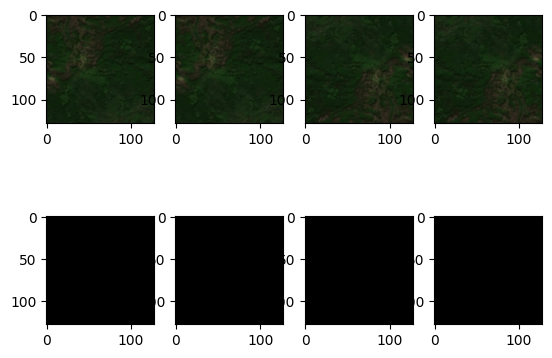

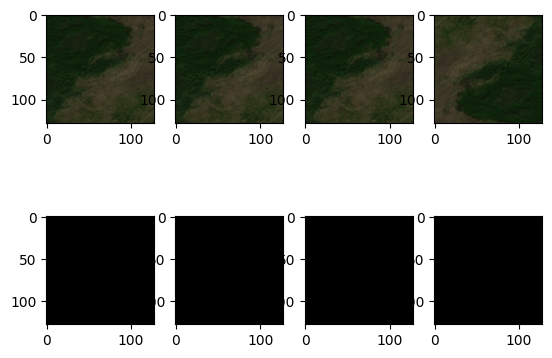

In [6]:
for i in range(10):
    img = images_train[i]
    mask = mask_train[i]

    fig, ax = plt.subplots(2, augmentation_factor + 1)
    ax[0][0].imshow(img)
    
    for j in range(augmentation_factor):
        index = i * augmentation_factor + j
        ax[0][j + 1].imshow(augmented_images_train[index])
        ax[1][j + 1].imshow(augmented_masks_train[index], cmap="gray")
    
    ax[1][0].imshow(mask, cmap="gray")

In [7]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [8]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer=input_layer, start_neurons=16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
# model.summary()

I0000 00:00:1743459459.202196   15997 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9325 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1


In [9]:
# Post Process
def mask_threshold(image, threshold=0.25):
    return image > threshold


# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
    def __init__(self, save=False):
        self.save = save

    def on_epoch_end(self, epoch, logs=None):
        k = np.random.randint(len(augmented_images_train))
        original_image = augmented_images_train[k][np.newaxis, ...]
        predicted_mask = self.model.predict(original_image).reshape(128, 128)
        proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
        proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
        proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
        proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
        mask = augmented_masks_train[k].reshape(128, 128)

        plt.figure(figsize=(15, 10))

        plt.subplot(1, 7, 1)
        plt.imshow(original_image[0])
        plt.title("Orginal Image")

        plt.subplot(1, 7, 2)
        plt.imshow(predicted_mask, cmap="gray")
        plt.title("Predicted Mask")

        plt.subplot(1, 7, 3)
        plt.imshow(mask, cmap="gray")
        plt.title("Orginal Mask")

        plt.subplot(1, 7, 4)
        plt.imshow(proc_mask02, cmap="gray")
        plt.title("Processed: 0.2")

        plt.subplot(1, 7, 5)
        plt.imshow(proc_mask03, cmap="gray")
        plt.title("Processed: 0.3")

        plt.subplot(1, 7, 6)
        plt.imshow(proc_mask04, cmap="gray")
        plt.title("Processed: 0.4")

        plt.subplot(1, 7, 6)
        plt.imshow(proc_mask05, cmap="gray")
        plt.title("Processed: 0.5")

        plt.tight_layout()
        plt.show()

Epoch 1/100


I0000 00:00:1743459464.624835   16170 service.cc:148] XLA service 0x7f099c014aa0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1743459464.625034   16170 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2025-03-31 15:17:44.716508: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1743459465.053526   16170 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-03-31 15:17:45.767513: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[32,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_con

  1/405 ━━━━━━━━━━━━━━━━━━━━ 1:15:48 11s/step - accuracy: 0.4182 - loss: 0.6910

2025-03-31 15:17:53.973425: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1743459474.003947   16170 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


405/405 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.7205 - loss: 0.4388

2025-03-31 15:18:10.869809: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-03-31 15:18:10.890013: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


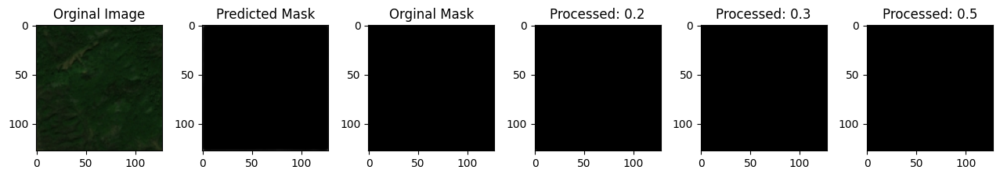

405/405 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - accuracy: 0.7206 - loss: 0.4386
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7852 - loss: 0.28


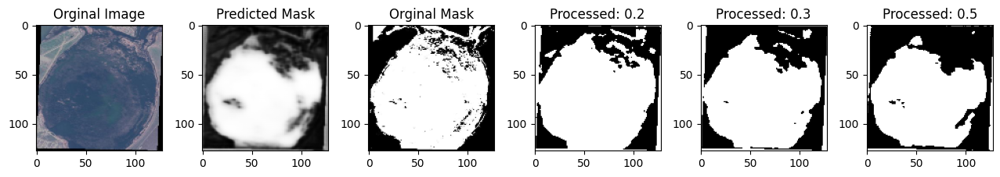

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.7852 - loss: 0.2823
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7922 - loss: 0.259


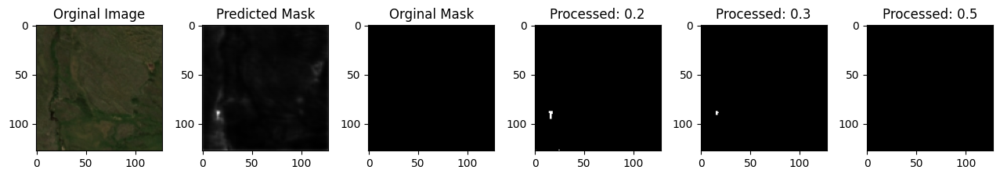

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.7923 - loss: 0.2596
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8030 - loss: 0.23


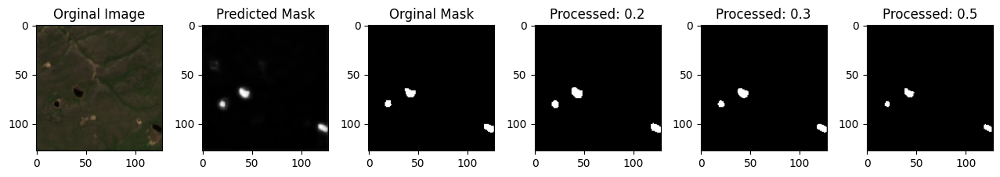

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8030 - loss: 0.2363
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8082 - loss: 0.21


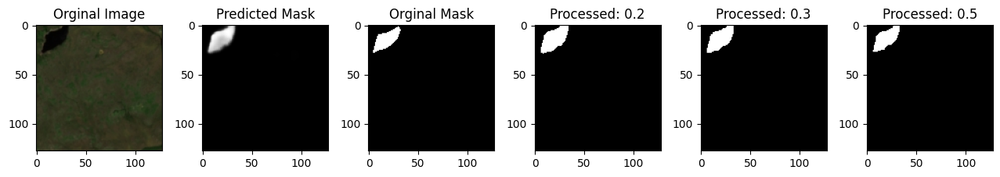

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8082 - loss: 0.2178
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8119 - loss: 0.20


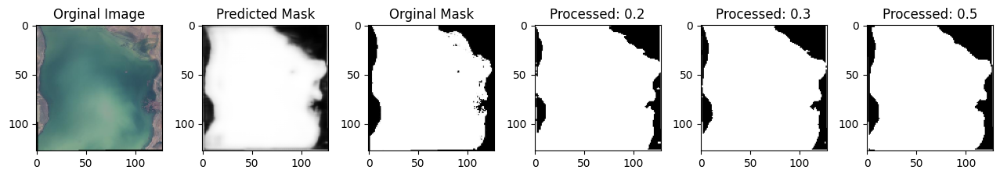

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8119 - loss: 0.2061
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8169 - loss: 0.194


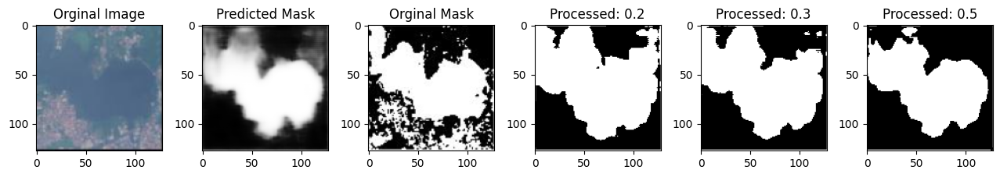

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8169 - loss: 0.1946
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8188 - loss: 0.18


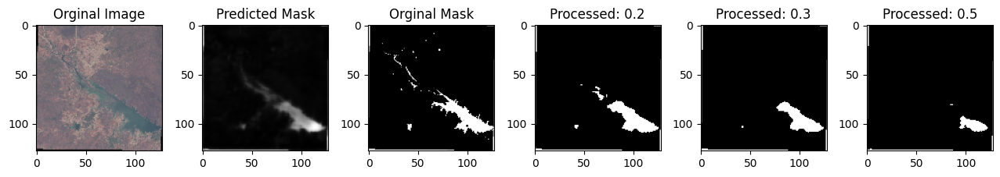

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8188 - loss: 0.1898
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8182 - loss: 0.19


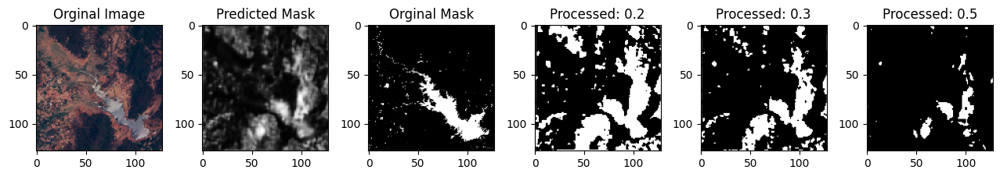

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8182 - loss: 0.1924
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8199 - loss: 0.18


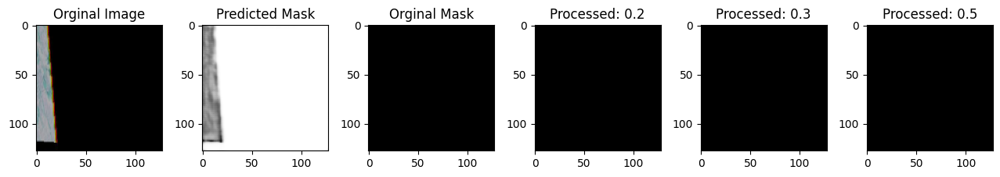

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8199 - loss: 0.1852
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8204 - loss: 0.184


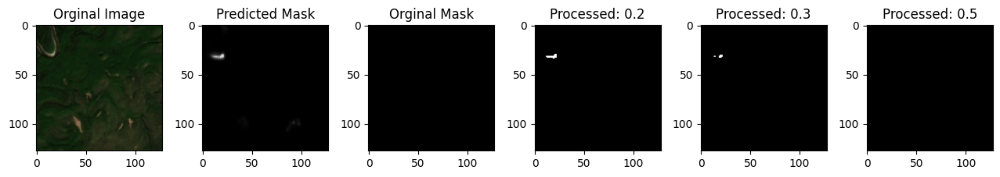

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8204 - loss: 0.1848
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8238 - loss: 0.17


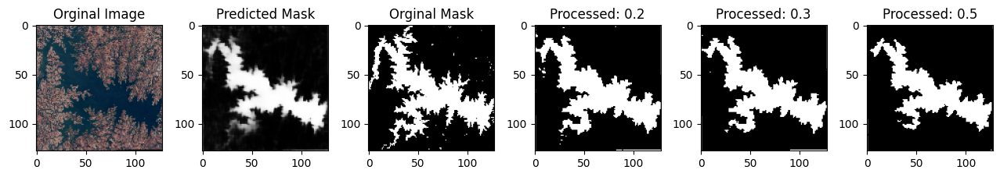

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8238 - loss: 0.1761
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8225 - loss: 0.17


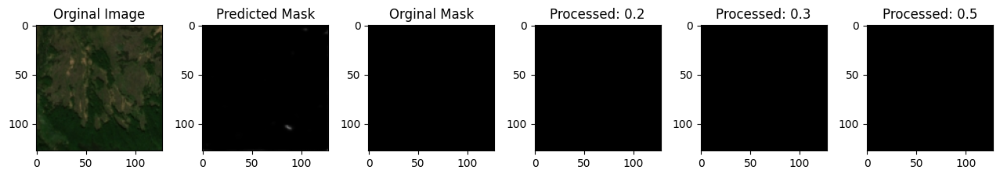

405/405 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - accuracy: 0.8225 - loss: 0.1770
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8260 - loss: 0.17


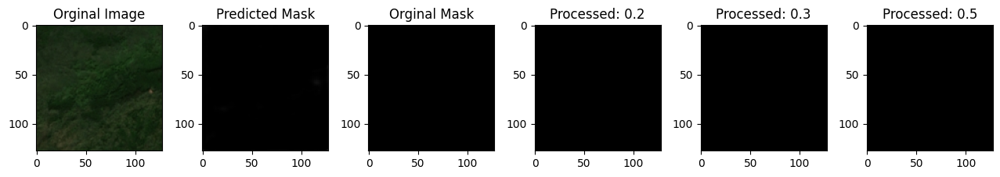

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8260 - loss: 0.1710
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8254 - loss: 0.17


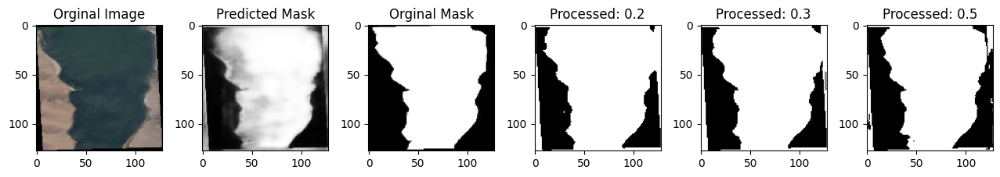

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8254 - loss: 0.1759
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8241 - loss: 0.17


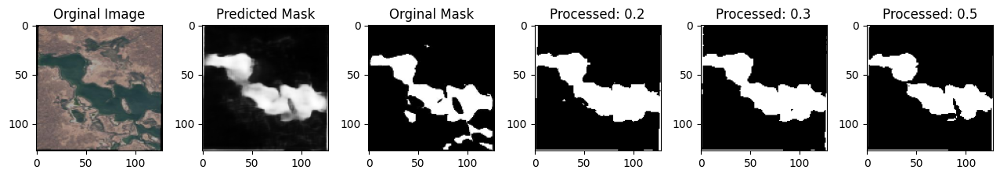

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8241 - loss: 0.1762
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8293 - loss: 0.16


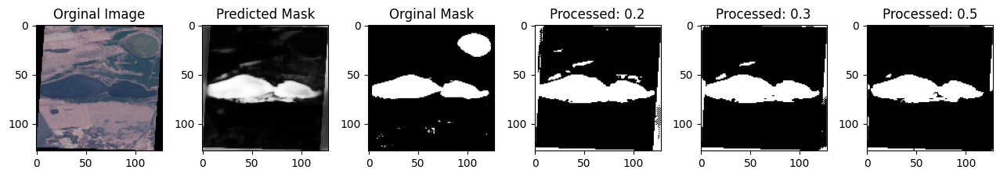

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8292 - loss: 0.1684
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8272 - loss: 0.16


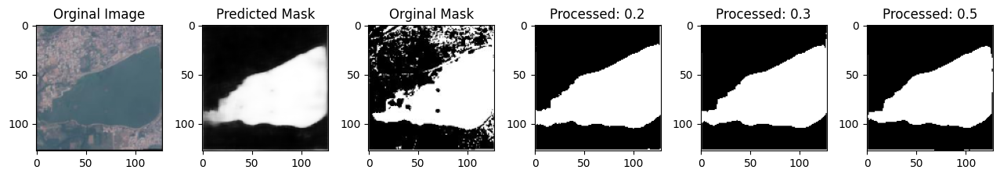

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8272 - loss: 0.1648
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8310 - loss: 0.15


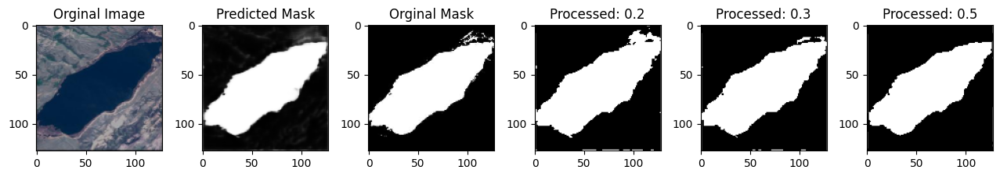

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8310 - loss: 0.1594
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8296 - loss: 0.163


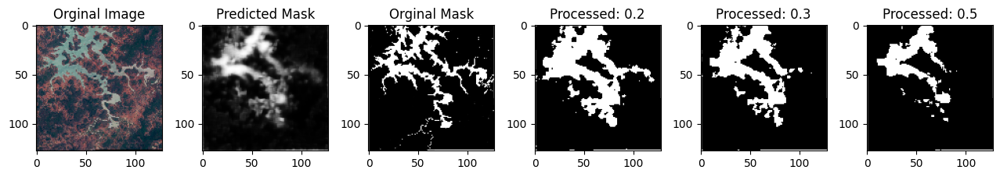

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8296 - loss: 0.1632
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8255 - loss: 0.17


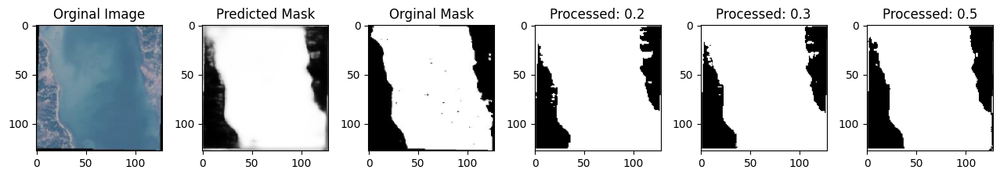

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8255 - loss: 0.1759
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8289 - loss: 0.165


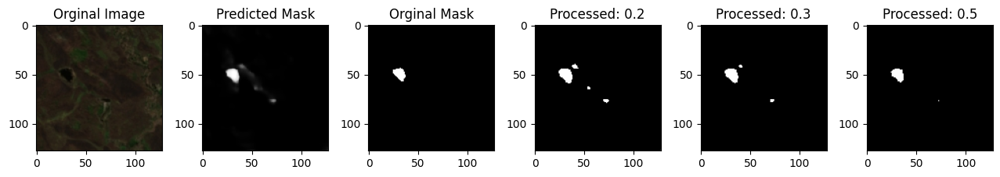

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8289 - loss: 0.1654
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8277 - loss: 0.16


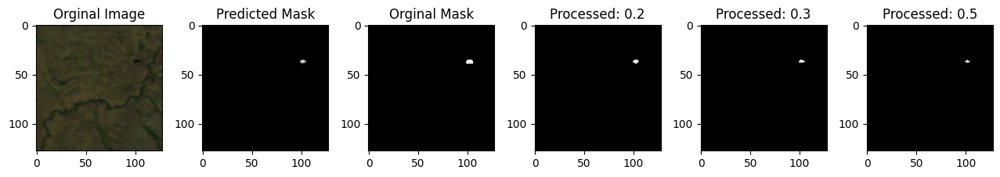

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8277 - loss: 0.1605
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8312 - loss: 0.15


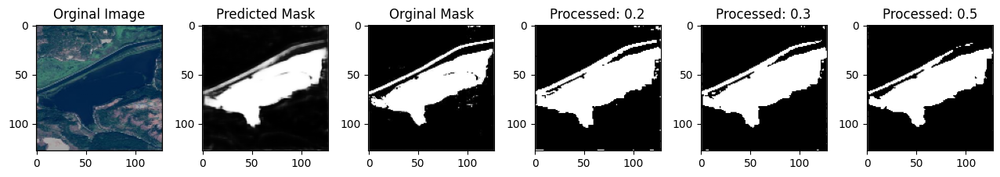

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8312 - loss: 0.1562
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8303 - loss: 0.15


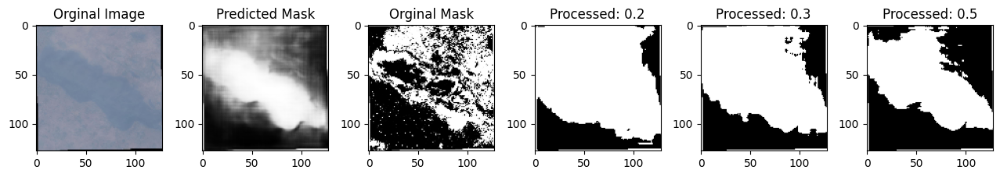

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8303 - loss: 0.1542
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8217 - loss: 0.17


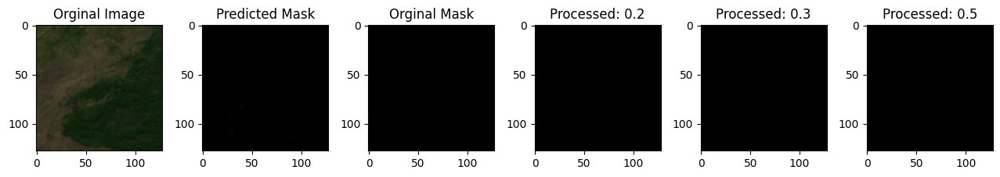

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8217 - loss: 0.1750
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8293 - loss: 0.16


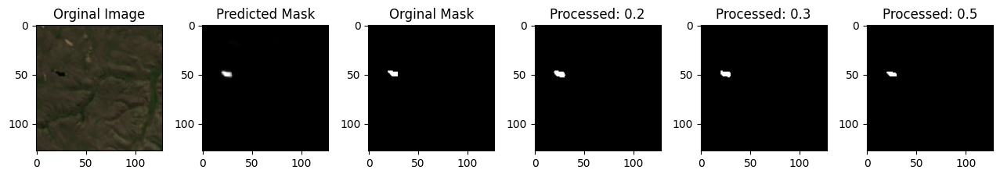

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8293 - loss: 0.1616
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8330 - loss: 0.153


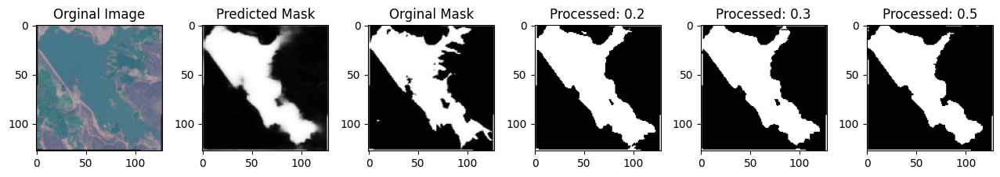

405/405 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - accuracy: 0.8330 - loss: 0.1532
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8337 - loss: 0.15


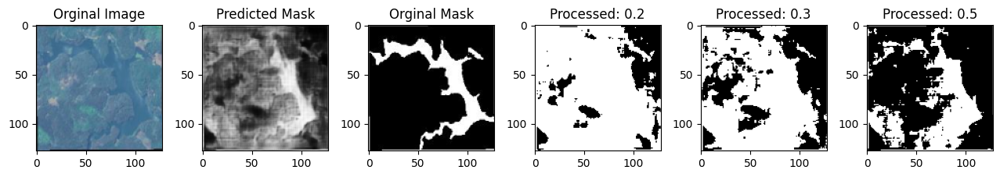

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - accuracy: 0.8337 - loss: 0.1528
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8297 - loss: 0.16


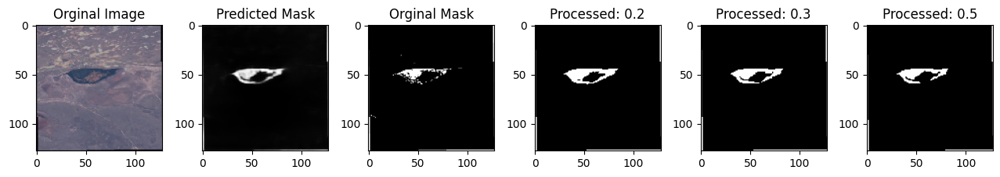

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8297 - loss: 0.1616
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8312 - loss: 0.151


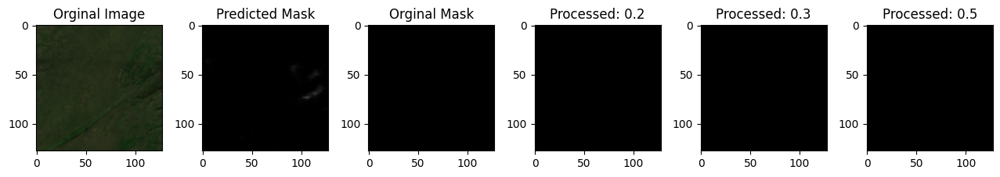

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8312 - loss: 0.1514
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8318 - loss: 0.15


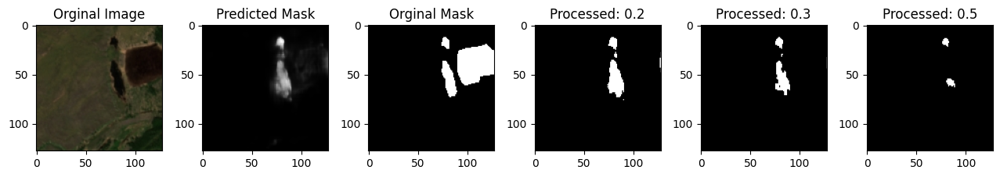

405/405 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - accuracy: 0.8318 - loss: 0.1544
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8305 - loss: 0.15


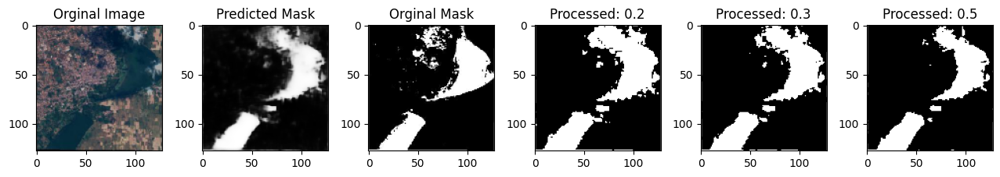

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8305 - loss: 0.1556
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8343 - loss: 0.14


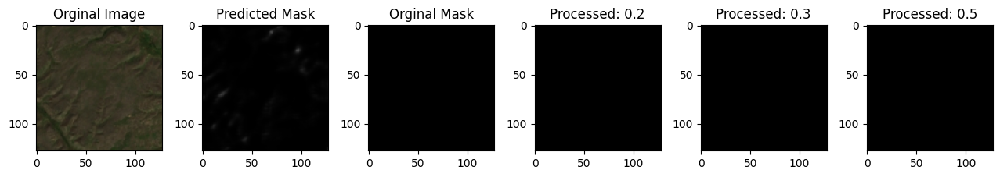

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8343 - loss: 0.1469
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8315 - loss: 0.15


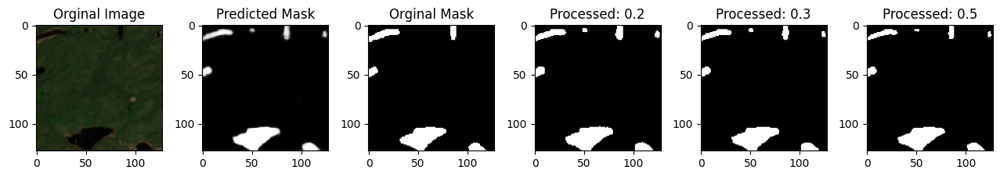

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8315 - loss: 0.1505
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8343 - loss: 0.146


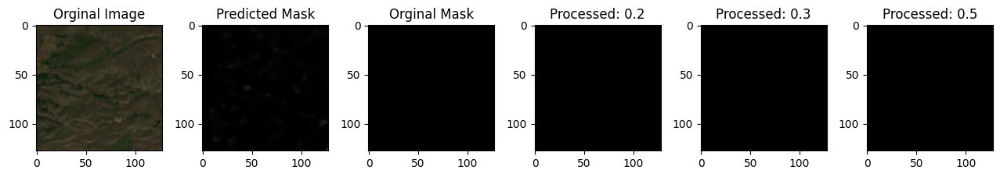

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8343 - loss: 0.1469
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8371 - loss: 0.13


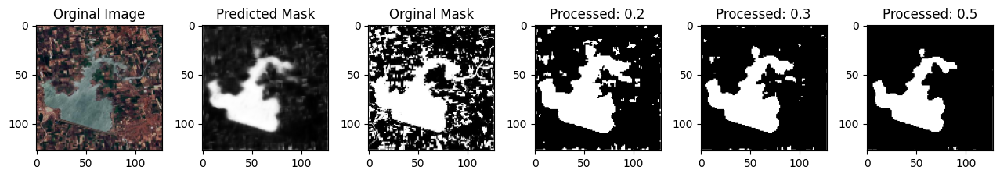

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8371 - loss: 0.1391
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8345 - loss: 0.14


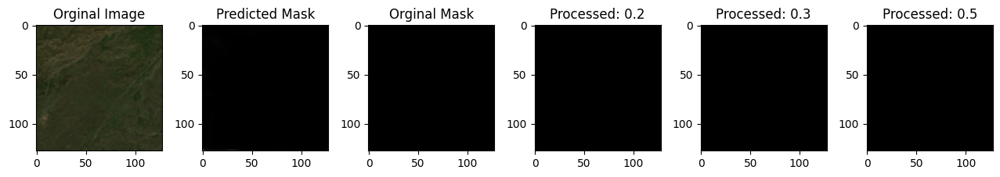

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8345 - loss: 0.1435
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8338 - loss: 0.14


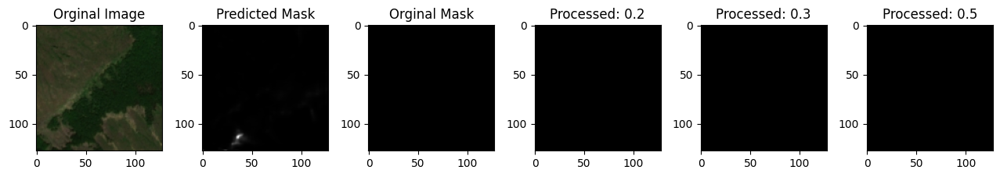

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8338 - loss: 0.1472
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8321 - loss: 0.15


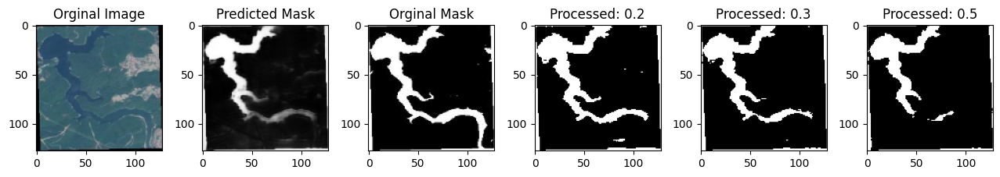

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8321 - loss: 0.1561
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8302 - loss: 0.156


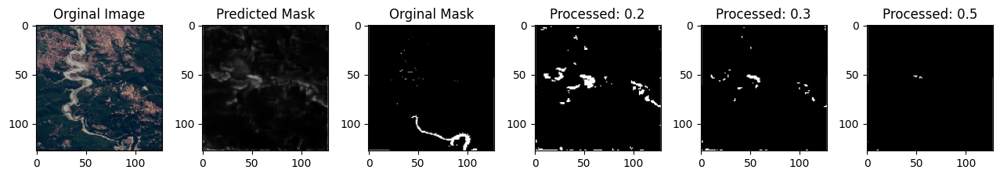

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8302 - loss: 0.1566
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8363 - loss: 0.141


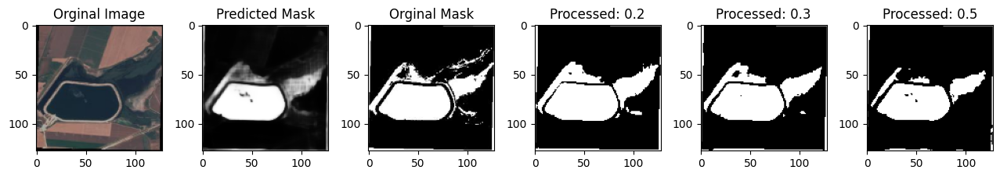

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8363 - loss: 0.1410
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8341 - loss: 0.141


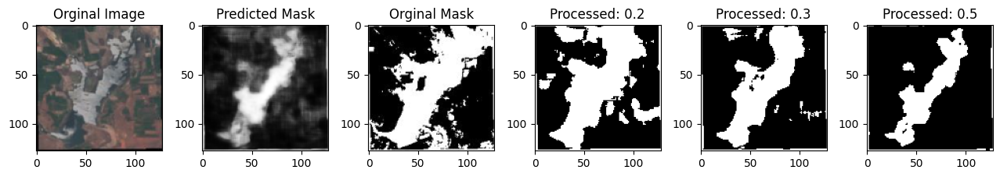

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8341 - loss: 0.1411
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8339 - loss: 0.14


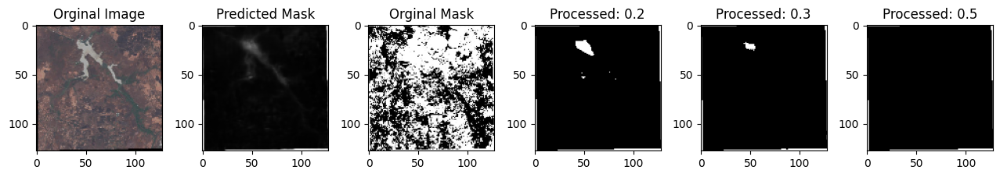

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8339 - loss: 0.1420
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8367 - loss: 0.13


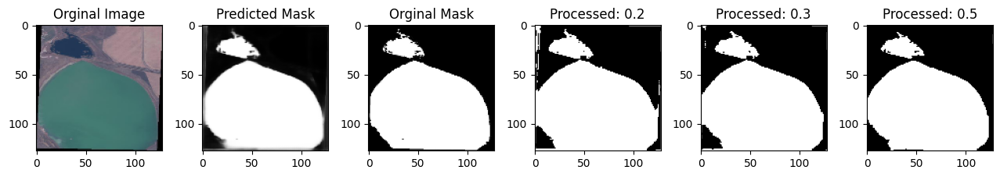

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8367 - loss: 0.1375
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8343 - loss: 0.140


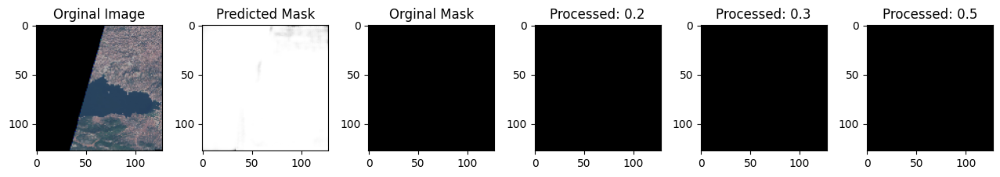

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8343 - loss: 0.1404
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8378 - loss: 0.140


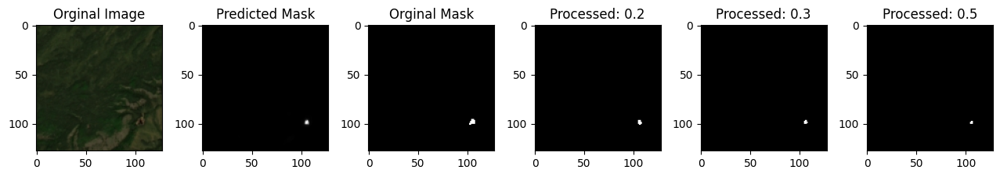

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8378 - loss: 0.1405
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8336 - loss: 0.14


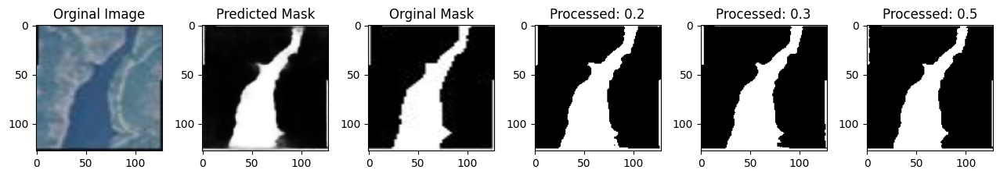

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8336 - loss: 0.1428
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8345 - loss: 0.14


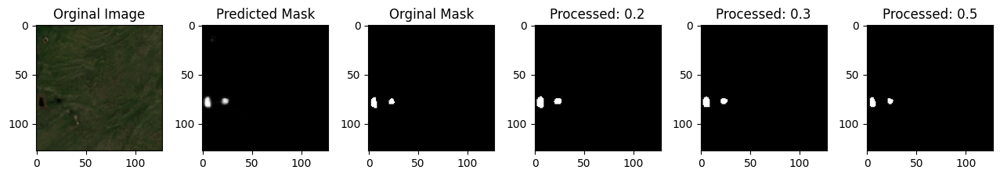

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8345 - loss: 0.1400
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8362 - loss: 0.13


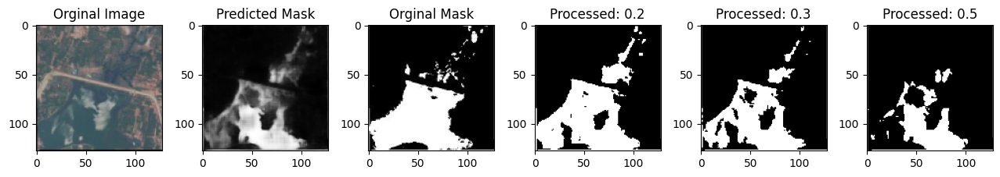

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8362 - loss: 0.1368
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8324 - loss: 0.14


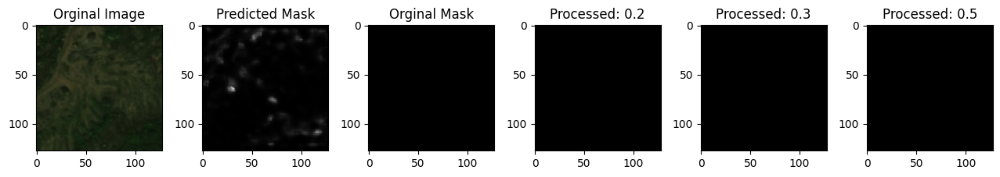

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8324 - loss: 0.1438
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8351 - loss: 0.142


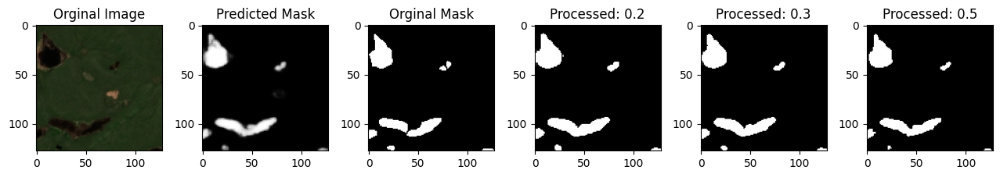

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8351 - loss: 0.1423
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8337 - loss: 0.14


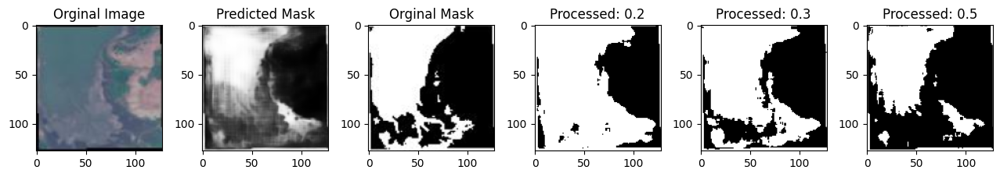

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8337 - loss: 0.1410
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8329 - loss: 0.136


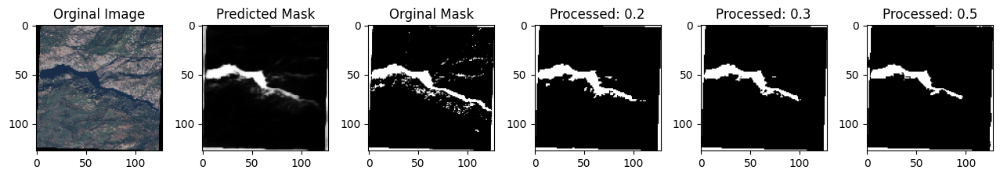

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8329 - loss: 0.1365
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8364 - loss: 0.13


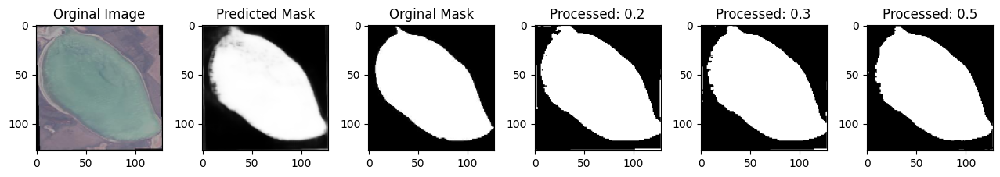

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8364 - loss: 0.1382
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8369 - loss: 0.135


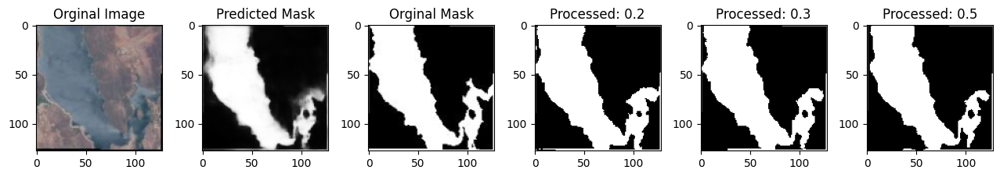

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8369 - loss: 0.1354
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8390 - loss: 0.13


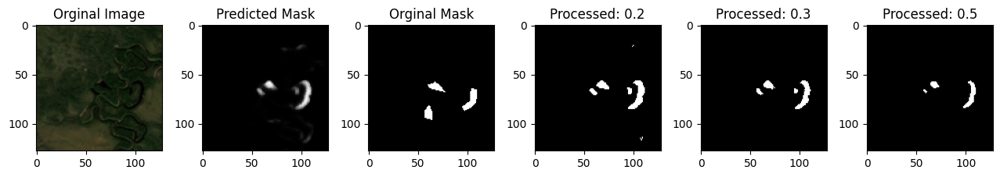

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8390 - loss: 0.1330
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8345 - loss: 0.13


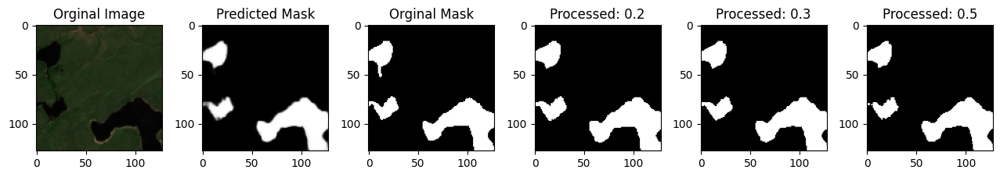

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8345 - loss: 0.1369
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8377 - loss: 0.134


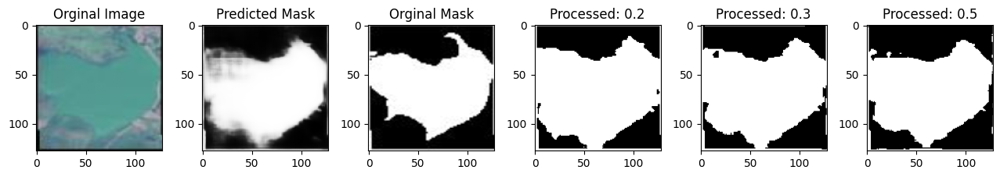

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8377 - loss: 0.1344
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8399 - loss: 0.13


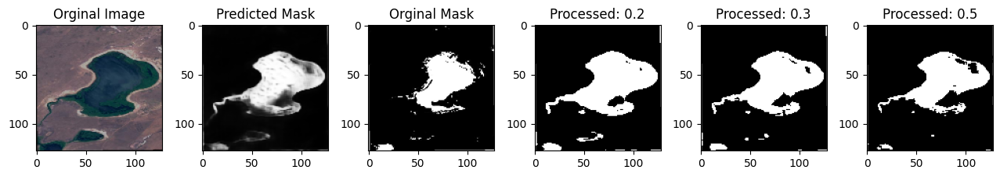

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8399 - loss: 0.1304
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8384 - loss: 0.13


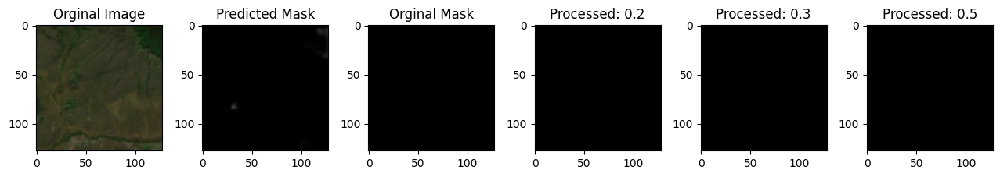

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - accuracy: 0.8384 - loss: 0.1330
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8394 - loss: 0.134


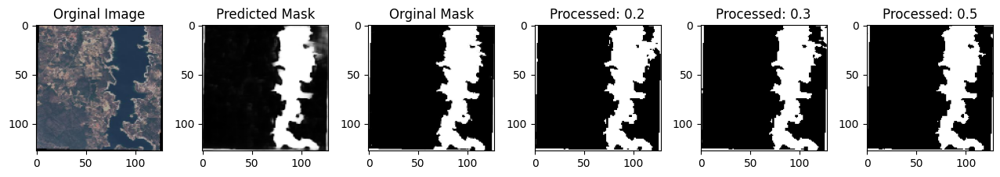

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8394 - loss: 0.1341
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8367 - loss: 0.13


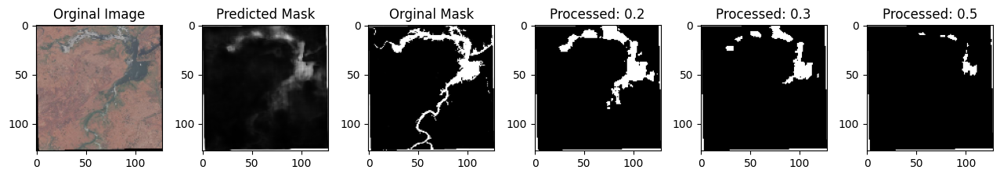

405/405 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - accuracy: 0.8367 - loss: 0.1395
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8382 - loss: 0.133


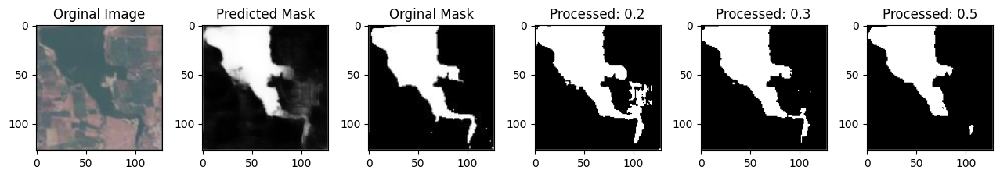

405/405 ━━━━━━━━━━━━━━━━━━━━ 18s 43ms/step - accuracy: 0.8382 - loss: 0.1332
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8369 - loss: 0.13


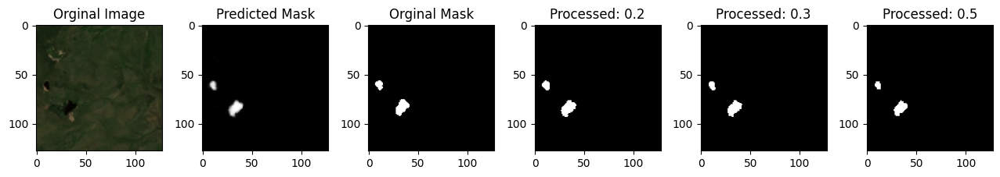

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8369 - loss: 0.1313
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8375 - loss: 0.12


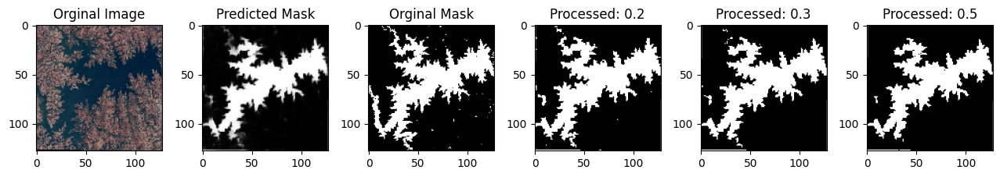

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8375 - loss: 0.1294
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8372 - loss: 0.13


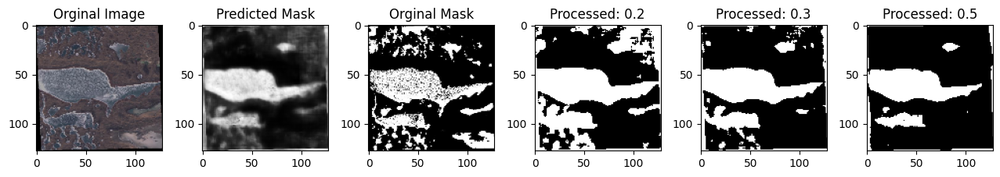

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8372 - loss: 0.1339
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8363 - loss: 0.130


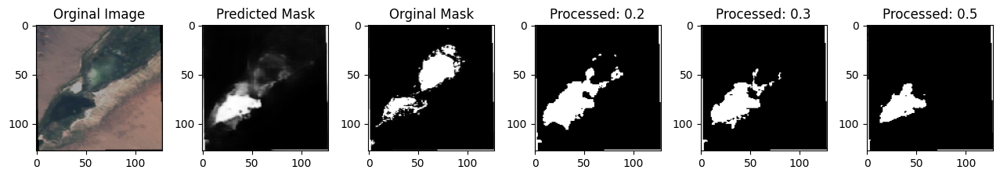

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8363 - loss: 0.1300
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8369 - loss: 0.130


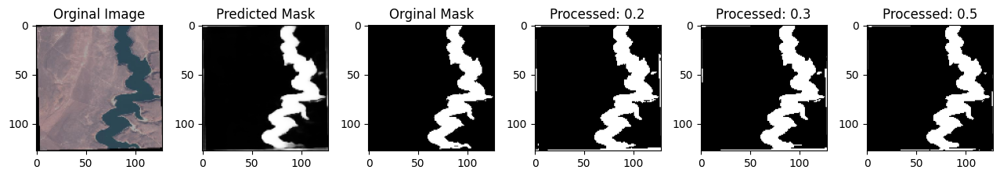

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8369 - loss: 0.1302
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8353 - loss: 0.136


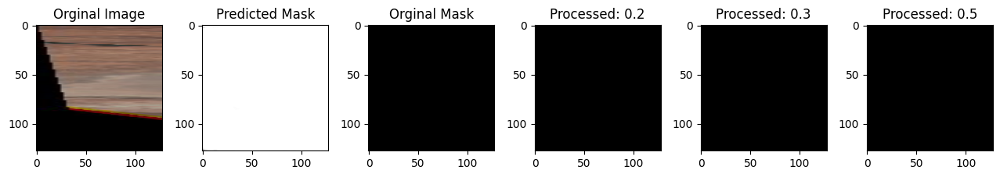

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8353 - loss: 0.1363
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8408 - loss: 0.128


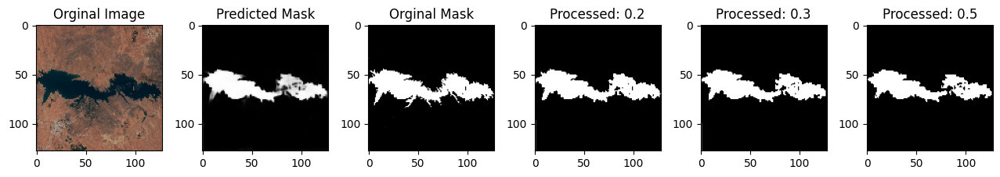

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8408 - loss: 0.1282
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8361 - loss: 0.13


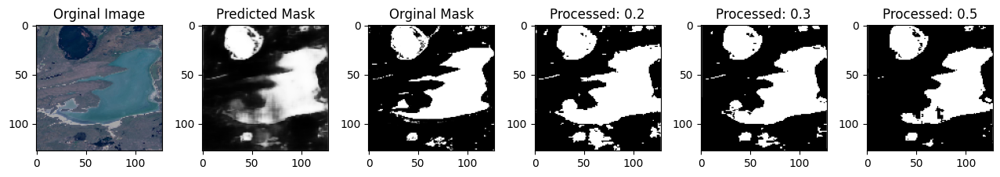

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8361 - loss: 0.1390
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8381 - loss: 0.12


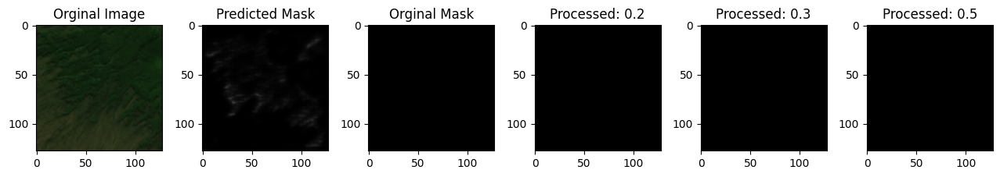

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8381 - loss: 0.1278
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8387 - loss: 0.126


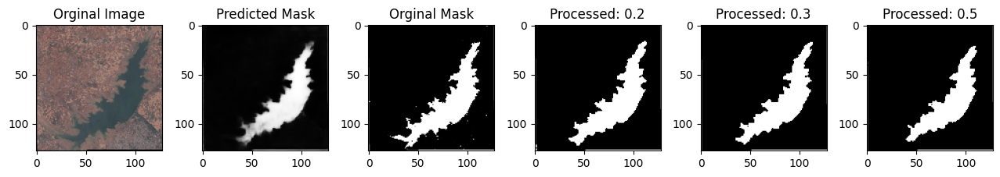

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8387 - loss: 0.1268
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8383 - loss: 0.12


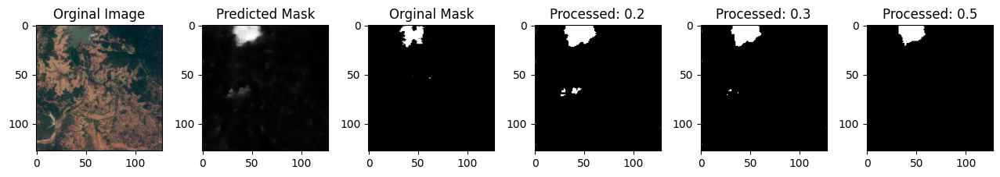

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8383 - loss: 0.1278
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8433 - loss: 0.12


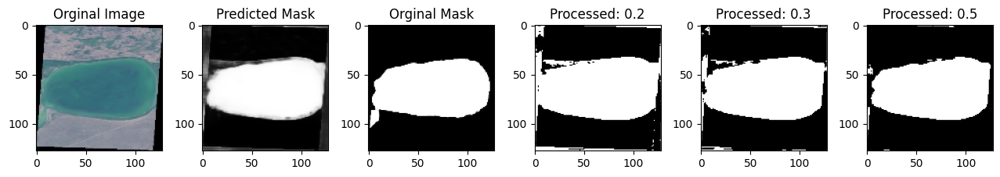

405/405 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - accuracy: 0.8432 - loss: 0.1277
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8419 - loss: 0.126


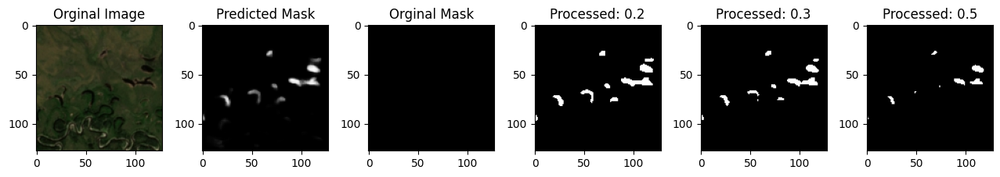

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8419 - loss: 0.1264
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8360 - loss: 0.136


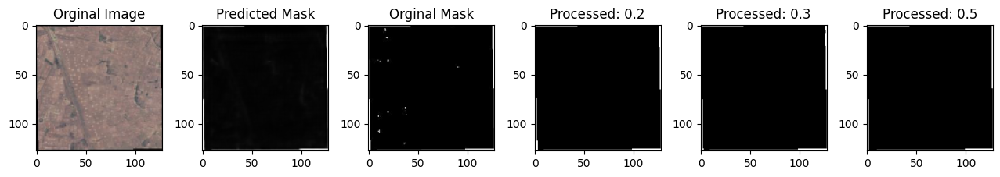

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8360 - loss: 0.1361
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8328 - loss: 0.146


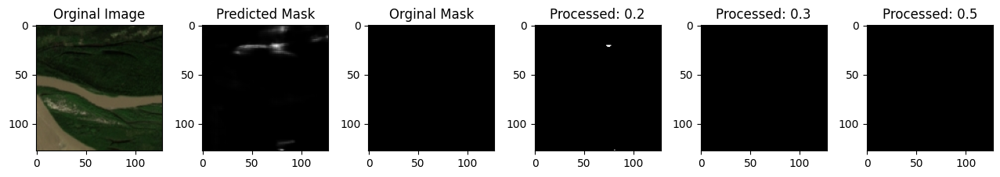

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8329 - loss: 0.1464
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8381 - loss: 0.128


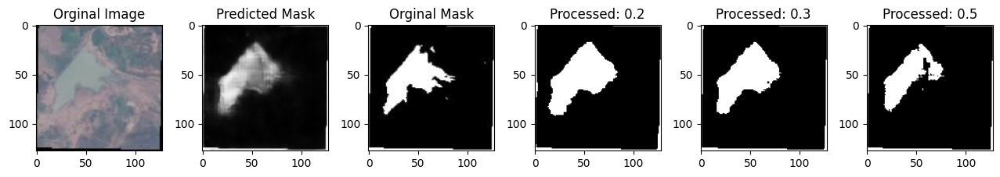

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8381 - loss: 0.1283
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8369 - loss: 0.13


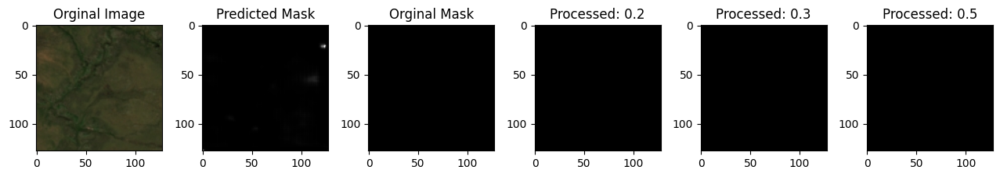

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8369 - loss: 0.1368
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8400 - loss: 0.12


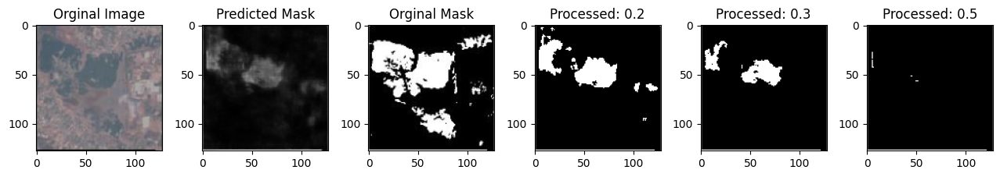

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - accuracy: 0.8400 - loss: 0.1271
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8371 - loss: 0.12


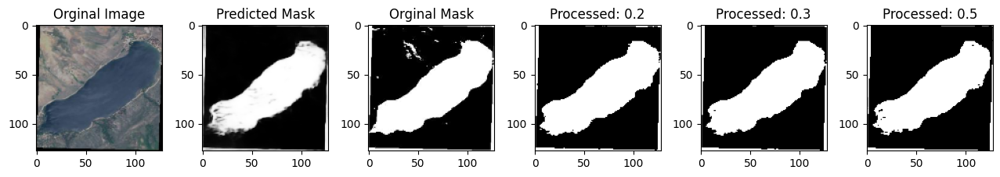

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8371 - loss: 0.1284
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8387 - loss: 0.12


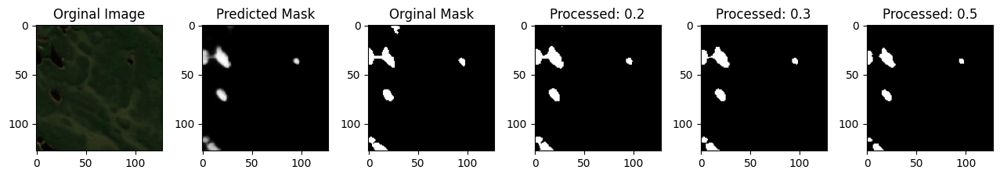

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8387 - loss: 0.1235
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8381 - loss: 0.12


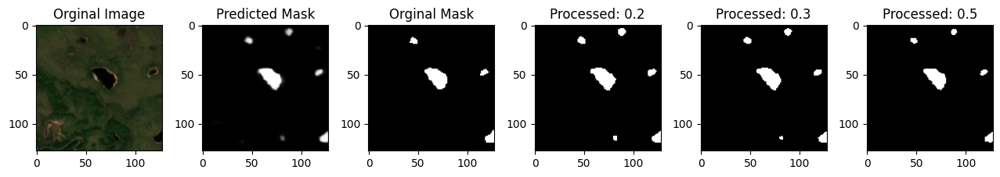

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8381 - loss: 0.1263
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.8396 - loss: 0.121


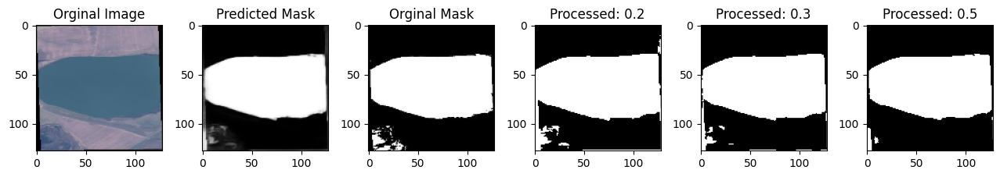

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8396 - loss: 0.1219
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8404 - loss: 0.12


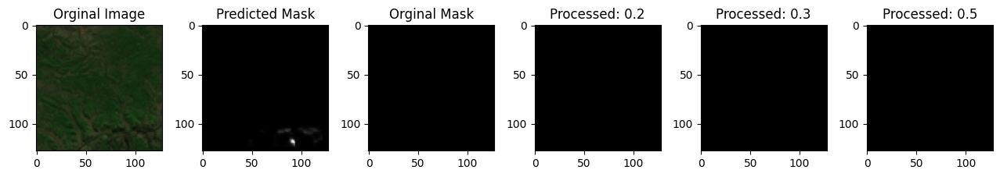

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8404 - loss: 0.1217
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8406 - loss: 0.121


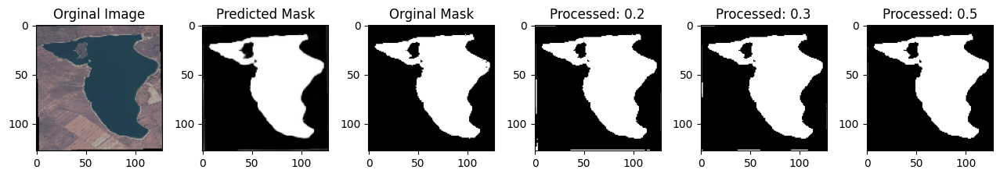

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8406 - loss: 0.1215
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8393 - loss: 0.121


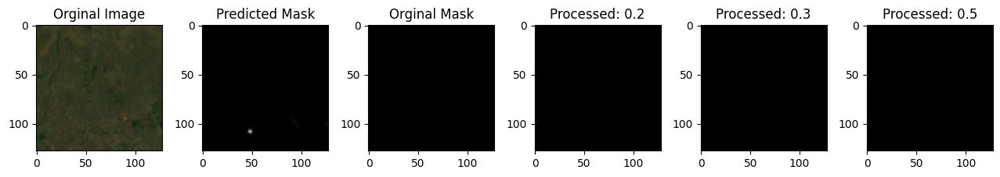

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8393 - loss: 0.1219
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8415 - loss: 0.11


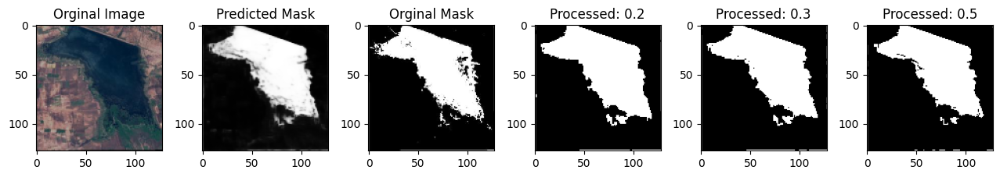

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8415 - loss: 0.1198
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8341 - loss: 0.13


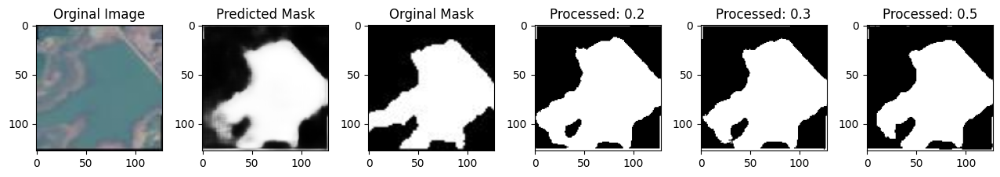

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8341 - loss: 0.1350
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8430 - loss: 0.12


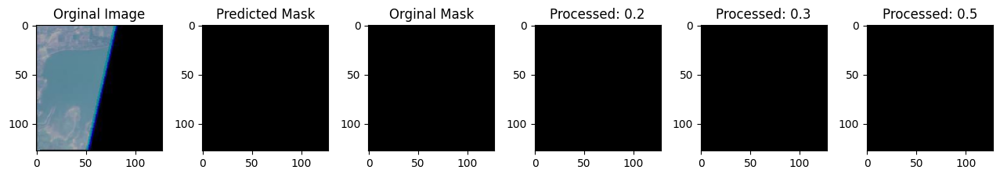

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8430 - loss: 0.1202
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8390 - loss: 0.12


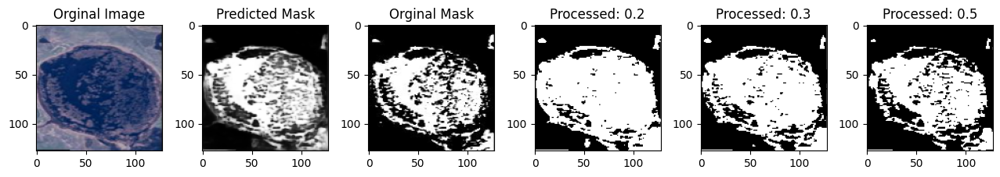

405/405 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - accuracy: 0.8390 - loss: 0.1248
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8411 - loss: 0.12


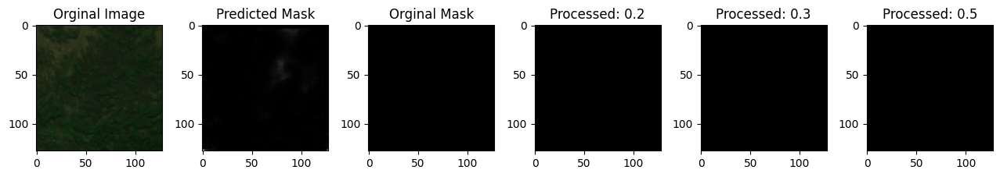

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8411 - loss: 0.1221
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8310 - loss: 0.150


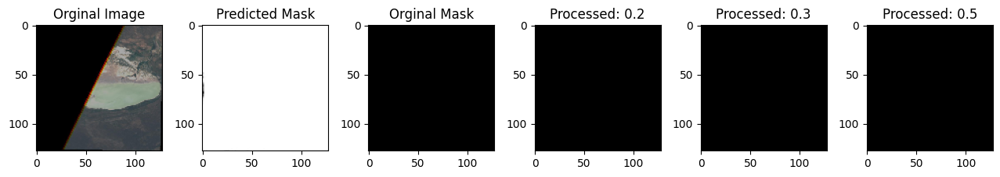

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8310 - loss: 0.1504
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8370 - loss: 0.13


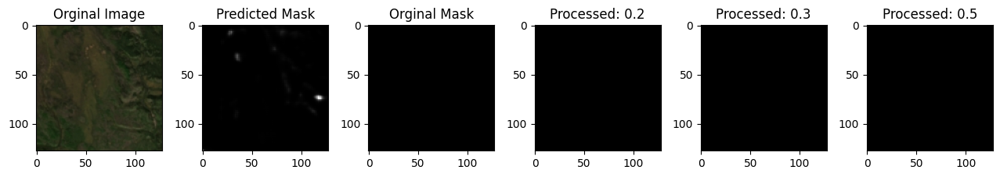

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8370 - loss: 0.1336
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8431 - loss: 0.11


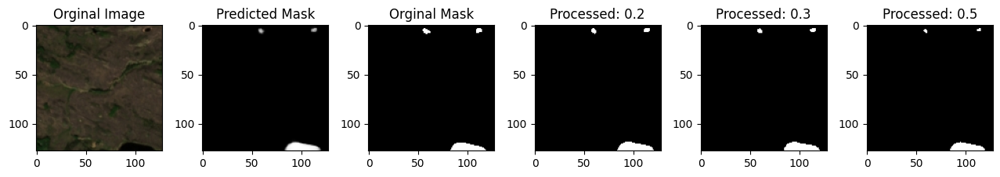

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8431 - loss: 0.1181
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8422 - loss: 0.119


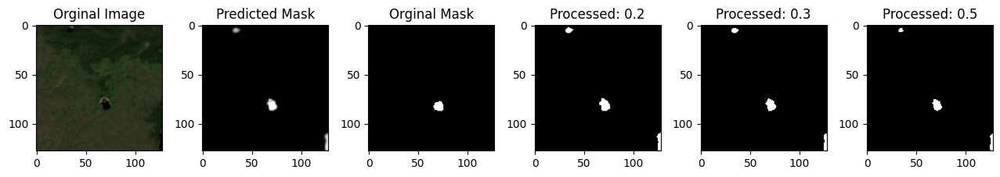

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8422 - loss: 0.1193
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8408 - loss: 0.122


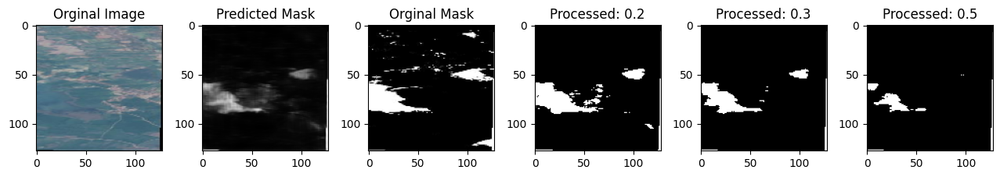

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8408 - loss: 0.1224
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8419 - loss: 0.11


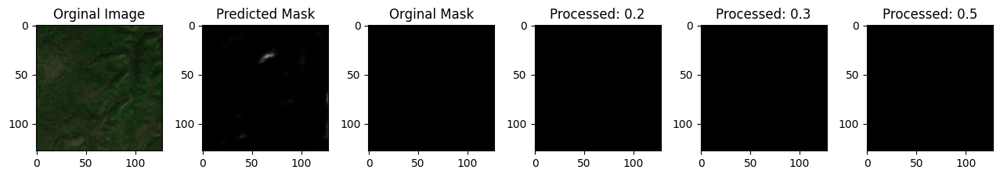

405/405 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8419 - loss: 0.1189


In [10]:
epochs = 100
batch_size = 32

history = model.fit(
    augmented_images_train,  # Use augmented data instead of original
    augmented_masks_train,   # Use augmented masks
    epochs=epochs,
    callbacks=[ShowProgress()],
    batch_size=batch_size,
    shuffle=True             # Make sure to shuffle
)

In [11]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

# Save the model with the current date and time in the filename
model.save(f"../models/{current_time}.keras")

In [12]:
# Make predictions
predictions = model.predict(images_test)

KeyError: 'pop from an empty set'